<a href="https://colab.research.google.com/github/andresRah/coffe_analysis/blob/main/AnalisisExploratorioAndresArevalo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **NovaCoffe**
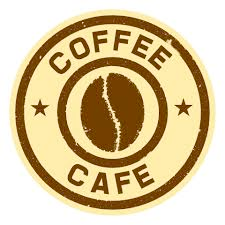

### **Abstracto**

NovaCoffe es una empresa dedicada a la comercialización y venta de café. Sin embargo, actualmente solo se enfoca en la comercialización de productos ya existentes. Con un ambicioso plan de expansión para los próximos cinco años, la empresa planea destinar un presupuesto significativo para iniciar sus propios cultivos de café. Este estudio tiene como objetivo proporcionar un análisis exhaustivo sobre la calidad y los volúmenes de producción de café a nivel mundial, con el fin de identificar las regiones más prometedoras y rentables para invertir.

El análisis de la producción y calidad del café a nivel mundial es crucial en un contexto donde el consumo global de café continúa en crecimiento y donde la calidad del producto tiene un impacto directo en los mercados y en la economía de los países productores. Comprender las variables que influyen en la producción y calidad del café, como el tipo de café, el origen geográfico y las condiciones de producción, puede ayudar a optimizar la cadena de suministro de la empresa NovaCoffe y a mejorar su competitividad en el mercado global.

### **Audiencia**

Este análisis será de particular interés para varios grupos, incluyendo:

**1) Productores de Café:** Para optimizar sus estrategias de producción y mejorar la calidad de su producto.

**2) Exportadores e Importadores:** Para identificar mercados clave y tendencias en la calidad del café.

**3) Analistas de Mercado:** Para prever fluctuaciones en la producción y la calidad del café, lo que puede impactar los precios globales.

**4) Investigadores Agrícolas:** Interesados en explorar las relaciones entre las variables de producción y calidad del café.

### **Preguntas Hipótesis**



1. ¿Cuáles son los principales países productores de café y cómo ha variado su producción a lo largo de los años?
2. ¿Existe una relación entre el tipo de café producido y la cantidad de producción en diferentes regiones?
3. ¿Cómo varían los atributos de calidad del café según el país de origen?
4. ¿Es posible predecir la cantidad de producción futura basada en datos históricos y atributos de calidad del café?
5. ¿Qué países tienen las calificaciones de calidad de café más altas y cómo se correlaciona esto con su producción total?

**Metadata**
**Dataset de Producción de Café:**

- Número de filas: 50
- Número de columnas: 33
- Tipos de variables:
- Country (Texto): País de producción.
- Coffee type (Texto): Tipo de café (Arabica, Robusta).
- Producción anual (1990/91 - 2019/20): Números enteros que representan la producción en toneladas.
- Total_production (Numérico): Producción total acumulada en toneladas.

**Dataset de Calidad de Café:**

- Número de filas: 1,336
- Número de columnas: 22
- Tipos de variables:
  * Species (Texto): Especie de café (Arabica, Robusta).
  * Continent of Origin, Country of Origin (Texto): Continentey país de origen.
  * Harvest Year (Numérico): Año de la cosecha.
  * Diversos atributos de calidad (numéricos): Aroma, Sabor, Acidez, Dulzura, entre otros.

### **Letura de los datasets**

In [1]:
from google.colab import drive
import os
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [2]:
os.chdir("/content/drive/MyDrive/CoderHouseDatascience")

In [3]:
import pandas as pd

In [4]:
coffee_quality = pd.read_csv('Coffee_Qlty.csv')
coffee_quality.head(5)

,REC_ID,Species,Continent.of.Origin,Country.of.Origin,Harvest.Year,Expiration,Variety,Color,Processing.Method,Aroma,...,Acidity,Body,Balance,Uniformity,Clean.Cup,Sweetness,Moisture,Quakers,Category.One.Defects,Category.Two.Defects
0,0,Arabica,Africa,Ethiopia,2014.0,04/03/16,NaN,Green,Washed / Wet,8.67,...,8.75,8.50,8.42,10.0,10.0,10.0,0.12,0,0,0
1,1,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.75,...,8.58,8.42,8.42,10.0,10.0,10.0,0.12,0,0,1
2,2,Arabica,North America,Guatemala,NaN,05/31/11,Bourbon,NaN,NaN,8.42,...,8.42,8.33,8.42,10.0,10.0,10.0,0.00,0,0,0
3,3,Arabica,Africa,Ethiopia,2014.0,03/25/16,NaN,Green,Natural / Dry,8.17,...,8.42,8.50,8.25,10.0,10.0,10.0,0.11,0,0,2
4,4,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.25,...,8.50,8.42,8.33,10.0,10.0,10.0,0.12,0,0,2


In [5]:
coffee_production = pd.read_csv('Coffee_production.csv')
coffee_production.head(5)

,Country,Coffee type,1990/91,1991/92,1992/93,1993/94,1994/95,1995/96,1996/97,1997/98,...,2011/12,2012/13,2013/14,2014/15,2015/16,2016/17,2017/18,2018/19,2019/20,Total_production
0,Angola,Robusta/Arabica,3.000000e+06,4.740000e+06,4.680000e+06,1.980000e+06,4.620000e+06,3.720000e+06,4.260000e+06,3.840000e+06,...,1.740000e+06,1.980000e+06,2.100000e+06,2.340000e+06,2.460000e+06,2.700000e+06,2.100000e+06,2.520000e+06,3.120000e+06,8.208000e+07
1,Bolivia (Plurinational State of),Arabica,7.380000e+06,6.240000e+06,7.200000e+06,3.060000e+06,7.020000e+06,8.520000e+06,7.500000e+06,8.460000e+06,...,7.920000e+06,6.300000e+06,7.200000e+06,6.000000e+06,5.040000e+06,4.680000e+06,5.040000e+06,4.980000e+06,4.860000e+06,2.070000e+08
2,Brazil,Arabica/Robusta,1.637160e+09,1.637580e+09,2.076180e+09,1.690020e+09,1.691520e+09,1.083600e+09,1.751820e+09,1.568880e+09,...,2.915520e+09,3.325080e+09,3.281340e+09,3.198300e+09,3.172260e+09,3.407280e+09,3.164400e+09,3.907860e+09,3.492660e+09,7.508298e+10
3,Burundi,Arabica/Robusta,2.922000e+07,4.002000e+07,3.720000e+07,2.358000e+07,3.984000e+07,2.604000e+07,2.406000e+07,1.500000e+07,...,1.224000e+07,2.436000e+07,9.780000e+06,1.488000e+07,1.614000e+07,1.176000e+07,1.212000e+07,1.224000e+07,1.632000e+07,6.236400e+08
4,Ecuador,Arabica/Robusta,9.024000e+07,1.274400e+08,7.110000e+07,1.241400e+08,1.425600e+08,1.132800e+08,1.195800e+08,7.146000e+07,...,4.950000e+07,4.968000e+07,3.996000e+07,3.864000e+07,3.864000e+07,3.870000e+07,3.744000e+07,2.976000e+07,3.354000e+07,1.900380e+09


In [6]:
# Obtenemos información de ambos datasets
coffee_quality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1339 entries, 0 to 1338
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   REC_ID                1339 non-null   int64  
 1   Species               1339 non-null   object 
 2   Continent.of.Origin   1338 non-null   object 
 3   Country.of.Origin     1338 non-null   object 
 4   Harvest.Year          1279 non-null   float64
 5   Expiration            1339 non-null   object 
 6   Variety               1113 non-null   object 
 7   Color                 1069 non-null   object 
 8   Processing.Method     1169 non-null   object 
 9   Aroma                 1339 non-null   float64
 10  Flavor                1339 non-null   float64
 11  Aftertaste            1339 non-null   float64
 12  Acidity               1339 non-null   float64
 13  Body                  1339 non-null   float64
 14  Balance               1339 non-null   float64
 15  Uniformity           

In [7]:
coffee_production.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55 entries, 0 to 54
Data columns (total 33 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country           55 non-null     object 
 1   Coffee type       55 non-null     object 
 2   1990/91           55 non-null     float64
 3   1991/92           55 non-null     float64
 4   1992/93           55 non-null     float64
 5   1993/94           55 non-null     float64
 6   1994/95           55 non-null     float64
 7   1995/96           55 non-null     float64
 8   1996/97           55 non-null     float64
 9   1997/98           55 non-null     float64
 10  1998/99           55 non-null     float64
 11  1999/00           55 non-null     float64
 12  2000/01           55 non-null     float64
 13  2001/02           55 non-null     float64
 14  2002/03           55 non-null     float64
 15  2003/04           55 non-null     float64
 16  2004/05           55 non-null     float64
 17 

In [8]:
coffee_quality.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
REC_ID,1339.0,NaN,NaN,NaN,669.0,386.680316,0.0,334.5,669.0,1003.5,1338.0
Species,1339,2,Arabica,1311,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Continent.of.Origin,1338,5,North America,665,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Country.of.Origin,1338,34,Mexico,236,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Harvest.Year,1279.0,NaN,NaN,NaN,2013.567631,1.808496,2009.0,2012.0,2013.0,2015.0,2018.0
Expiration,1339,565,12/26/14,25,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Variety,1113,29,Caturra,256,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Color,1069,3,Green,870,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Processing.Method,1169,5,Washed / Wet,815,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Aroma,1339.0,NaN,NaN,NaN,7.566706,0.37756,0.0,7.42,7.58,7.75,8.75


In [9]:
coffee_production.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Country,55,55,Angola,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Coffee type,55,4,Arabica,22,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990/91,55.0,NaN,NaN,NaN,101705454.545455,251087494.251898,0.0,2430000.0,27660000.0,92160000.0,1637160000.0
1991/92,55.0,NaN,NaN,NaN,110475272.727273,266846602.43123,0.0,3900000.0,27780000.0,97200000.0,1637580000.0
1992/93,55.0,NaN,NaN,NaN,107477454.545455,302218031.156918,0.0,2640000.0,30000000.0,92340000.0,2076180000.0
1993/94,55.0,NaN,NaN,NaN,100100727.272727,248934369.186788,0.0,2130000.0,26520000.0,94860000.0,1690020000.0
1994/95,55.0,NaN,NaN,NaN,101797090.909091,251032797.721973,0.0,2610000.0,24360000.0,115320000.0,1691520000.0
1995/96,55.0,NaN,NaN,NaN,95259272.727273,185868047.179778,0.0,2610000.0,26040000.0,112770000.0,1083600000.0
1996/97,55.0,NaN,NaN,NaN,112702909.090909,260219212.842021,0.0,2340000.0,24060000.0,113970000.0,1751820000.0
1997/98,55.0,NaN,NaN,NaN,108967636.363636,243014500.81687,0.0,2880000.0,18000000.0,96690000.0,1568880000.0


## Fusionar datasets para tener los datos de la producción total en la última decada y el promedio por país
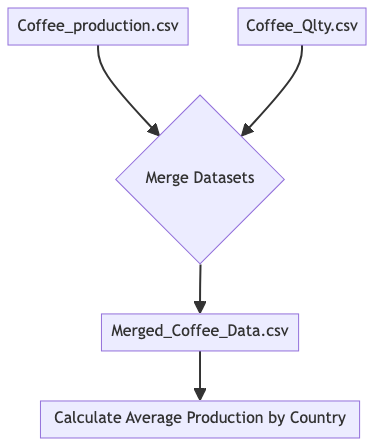

In [10]:
# Calcular la producción total y promedio para cada país

# Seleccionar las columnas de años que contienen los datos de producción
production_years = coffee_production.columns[2:-1]  # Excluye las dos primeras columnas y la última (Total_production)

# Calcular la producción total y el promedio a lo largo de los años seleccionados
coffee_production['total_production'] = coffee_production[production_years].sum(axis=1)
coffee_production['avg_production'] = coffee_production[production_years].mean(axis=1)

# Crear un DataFrame con las estadísticas de producción
production_stats = coffee_production[['Country', 'total_production', 'avg_production']]

production_stats.head(10)

,Country,total_production,avg_production
0,Angola,8.208000e+07,2.736000e+06
1,Bolivia (Plurinational State of),2.070000e+08,6.900000e+06
2,Brazil,7.508298e+10,2.502766e+09
3,Burundi,6.236400e+08,2.078800e+07
4,Ecuador,1.900380e+09,6.334600e+07
5,Indonesia,1.540488e+10,5.134960e+08
6,Madagascar,1.045560e+09,3.485200e+07
7,Malawi,8.226000e+07,2.742000e+06
8,Papua New Guinea,1.803120e+09,6.010400e+07
9,Paraguay,6.222000e+07,2.074000e+06


In [11]:
# Unir las estadísticas de producción con el dataset de calidad de café
merged_df = pd.merge(coffee_quality, production_stats, how='left', left_on='Country.of.Origin', right_on='Country')
merged_df.head(8)

,REC_ID,Species,Continent.of.Origin,Country.of.Origin,Harvest.Year,Expiration,Variety,Color,Processing.Method,Aroma,...,Uniformity,Clean.Cup,Sweetness,Moisture,Quakers,Category.One.Defects,Category.Two.Defects,Country,total_production,avg_production
0,0,Arabica,Africa,Ethiopia,2014.0,04/03/16,NaN,Green,Washed / Wet,8.67,...,10.0,10.0,10.00,0.12,0,0,0,Ethiopia,8.669520e+09,2.889840e+08
1,1,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.75,...,10.0,10.0,10.00,0.12,0,0,1,Ethiopia,8.669520e+09,2.889840e+08
2,2,Arabica,North America,Guatemala,NaN,05/31/11,Bourbon,NaN,NaN,8.42,...,10.0,10.0,10.00,0.00,0,0,0,Guatemala,7.020540e+09,2.340180e+08
3,3,Arabica,Africa,Ethiopia,2014.0,03/25/16,NaN,Green,Natural / Dry,8.17,...,10.0,10.0,10.00,0.11,0,0,2,Ethiopia,8.669520e+09,2.889840e+08
4,4,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.25,...,10.0,10.0,10.00,0.12,0,0,2,Ethiopia,8.669520e+09,2.889840e+08
5,5,Arabica,South America,Brazil,2013.0,09/03/14,NaN,Bluish-Green,Natural / Dry,8.58,...,10.0,10.0,10.00,0.11,0,0,1,Brazil,7.508298e+10,2.502766e+09
6,6,Arabica,South America,Peru,2012.0,09/17/13,Other,Bluish-Green,Washed / Wet,8.42,...,10.0,10.0,10.00,0.11,0,0,0,Peru,5.317620e+09,1.772540e+08
7,7,Arabica,Africa,Ethiopia,2010.0,09/02/11,NaN,NaN,NaN,8.25,...,10.0,10.0,9.33,0.03,0,0,0,Ethiopia,8.669520e+09,2.889840e+08


In [12]:
# Rellenar los valores faltantes de producción con 0
merged_df['total_production'].fillna(0, inplace=True)
merged_df['avg_production'].fillna(0, inplace=True)

In [13]:
# Eliminar la columna extra 'Country' que resultó de la unión
merged_df.drop(columns=['Country'], inplace=True)

In [ ]:
merged_df.head()

,REC_ID,Species,Continent.of.Origin,Country.of.Origin,Harvest.Year,Expiration,Variety,Color,Processing.Method,Aroma,...,Balance,Uniformity,Clean.Cup,Sweetness,Moisture,Quakers,Category.One.Defects,Category.Two.Defects,total_production,avg_production
0,0,Arabica,Africa,Ethiopia,2014.0,04/03/16,NaN,Green,Washed / Wet,8.67,...,8.42,10.0,10.0,10.0,0.12,0,0,0,2.600856e+10,1.354612e+09
1,1,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.75,...,8.42,10.0,10.0,10.0,0.12,0,0,1,2.600856e+10,1.354612e+09
2,2,Arabica,North America,Guatemala,NaN,05/31/11,Bourbon,NaN,NaN,8.42,...,8.42,10.0,10.0,10.0,0.00,0,0,0,2.106162e+10,1.096959e+09
3,3,Arabica,Africa,Ethiopia,2014.0,03/25/16,NaN,Green,Natural / Dry,8.17,...,8.25,10.0,10.0,10.0,0.11,0,0,2,2.600856e+10,1.354612e+09
4,4,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.25,...,8.33,10.0,10.0,10.0,0.12,0,0,2,2.600856e+10,1.354612e+09


In [14]:
# Paises contenidos en el dataset
merged_df['Country.of.Origin'].unique()

array(['Ethiopia', 'Guatemala', 'Brazil', 'Peru', 'United States',
       'Indonesia', 'China', 'Costa Rica', 'Mexico', 'Uganda', 'Honduras',
       'Taiwan', 'Nicaragua', 'Tanzania', 'Kenya', 'Thailand', 'Colombia',
       'Panama', 'Papua New Guinea', 'El Salvador', 'Japan', 'Ecuador',
       'Haiti', 'Burundi', 'Vietnam', 'Philippines', 'Rwanda', 'Malawi',
       'Laos', 'Zambia', 'Myanmar', 'Mauritius', 'Cote dIvoire', nan,
       'India'], dtype=object)

## Mostrar Mapa con Indice de Producción por País

Para lograr esta visualización debemos obtener la latitud y longitud general de cada país y agregarlo a nuestro dataset. Para lograr el objetivo hacemos una llamada API por medio de Nominatim.

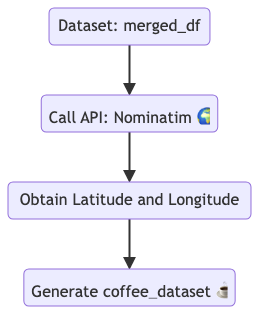

In [ ]:
from geopy.geocoders import Nominatim
import time

# Geolocator
geolocator = Nominatim(user_agent="coffee_analysis")

# Function para obtener latitude y longitude con delay
def get_lat_long(country_name):
    try:
        location = geolocator.geocode(country_name)
        if location:
            return location.latitude, location.longitude
        else:
            return None, None
    except Exception as e:
        return None, None

# Obtener los países únicos
unique_countries = merged_df['Country.of.Origin'].unique()

# Crear un diccionario para almacenar las coordenadas
country_coords = {}

# Obtener las coordenadas para cada país único
for country in unique_countries:
    lat, long = get_lat_long(country)
    country_coords[country] = (lat, long)
    time.sleep(1)  # Delay de 1 segundo entre cada solicitud

{'Ethiopia': (10.2116702, 38.6521203), 'Guatemala': (15.5855545, -90.345759), 'Brazil': (-10.3333333, -53.2), 'Peru': (-6.8699697, -75.0458515), 'United States': (39.7837304, -100.445882), 'Indonesia': (-2.4833826, 117.8902853), 'China': (35.000074, 104.999927), 'Costa Rica': (10.2735633, -84.0739102), 'Mexico': (19.4326296, -99.1331785), 'Uganda': (1.5333554, 32.2166578), 'Honduras': (15.2572432, -86.0755145), 'Taiwan': (23.5983227, 120.83537694479215), 'Nicaragua': (12.6090157, -85.2936911), 'Tanzania': (-6.5247123, 35.7878438), 'Kenya': (1.4419683, 38.4313975), 'Thailand': (14.8971921, 100.83273), 'Colombia': (4.099917, -72.9088133), 'Panama': (8.559559, -81.1308434), 'Papua New Guinea': (-5.6816069, 144.2489081), 'El Salvador': (13.8000382, -88.9140683), 'Japan': (36.5748441, 139.2394179), 'Ecuador': (-1.3397668, -79.3666965), 'Haiti': (19.1399952, -72.3570972), 'Burundi': (-3.426449, 29.9324519), 'Vietnam': (15.9266657, 107.9650855), 'Philippines': (12.7503486, 122.7312101), 'Rwan

In [ ]:
# Imprimir el contenido de country_coords
for country, coords in country_coords.items():
    print(f"{country}: {coords}")

Ethiopia: (10.2116702, 38.6521203)
Guatemala: (15.5855545, -90.345759)
Brazil: (-10.3333333, -53.2)
Peru: (-6.8699697, -75.0458515)
United States: (39.7837304, -100.445882)
Indonesia: (-2.4833826, 117.8902853)
China: (35.000074, 104.999927)
Costa Rica: (10.2735633, -84.0739102)
Mexico: (19.4326296, -99.1331785)
Uganda: (1.5333554, 32.2166578)
Honduras: (15.2572432, -86.0755145)
Taiwan: (23.5983227, 120.83537694479215)
Nicaragua: (12.6090157, -85.2936911)
Tanzania: (-6.5247123, 35.7878438)
Kenya: (1.4419683, 38.4313975)
Thailand: (14.8971921, 100.83273)
Colombia: (4.099917, -72.9088133)
Panama: (8.559559, -81.1308434)
Papua New Guinea: (-5.6816069, 144.2489081)
El Salvador: (13.8000382, -88.9140683)
Japan: (36.5748441, 139.2394179)
Ecuador: (-1.3397668, -79.3666965)
Haiti: (19.1399952, -72.3570972)
Burundi: (-3.426449, 29.9324519)
Vietnam: (15.9266657, 107.9650855)
Philippines: (12.7503486, 122.7312101)
Rwanda: (-1.9646631, 30.0644358)
Malawi: (-13.2687204, 33.9301963)
Laos: (20.0171109

In [ ]:
# Recorrer cada país único y actualizar las filas correspondientes en el DataFrame original
for country, coords in country_coords.items():
    # Filtrar las filas donde el país es igual al país actual
    indices = merged_df.index[merged_df['Country.of.Origin'] == country]

    # Reemplazar los valores de Latitude y Longitude en esas filas
    merged_df.loc[indices, 'Latitude'] = coords[0]
    merged_df.loc[indices, 'Longitude'] = coords[1]

# Vista previa del dataset actualizado
merged_df.head()

,REC_ID,Species,Continent.of.Origin,Country.of.Origin,Harvest.Year,Expiration,Variety,Color,Processing.Method,Aroma,...,Clean.Cup,Sweetness,Moisture,Quakers,Category.One.Defects,Category.Two.Defects,total_production,avg_production,Latitude,Longitude
0,0,Arabica,Africa,Ethiopia,2014.0,04/03/16,NaN,Green,Washed / Wet,8.67,...,10.0,10.0,0.12,0,0,0,2.600856e+10,1.354612e+09,10.211670,38.652120
1,1,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.75,...,10.0,10.0,0.12,0,0,1,2.600856e+10,1.354612e+09,10.211670,38.652120
2,2,Arabica,North America,Guatemala,NaN,05/31/11,Bourbon,NaN,NaN,8.42,...,10.0,10.0,0.00,0,0,0,2.106162e+10,1.096959e+09,15.585555,-90.345759
3,3,Arabica,Africa,Ethiopia,2014.0,03/25/16,NaN,Green,Natural / Dry,8.17,...,10.0,10.0,0.11,0,0,2,2.600856e+10,1.354612e+09,10.211670,38.652120
4,4,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.25,...,10.0,10.0,0.12,0,0,2,2.600856e+10,1.354612e+09,10.211670,38.652120


In [ ]:
# Guardamos el dataset resultante para evitar tener que recalcular el proceso anterior cada vez que se desconecte el ambiente de Colab
merged_df.to_csv('coffee_dataset.csv', index=False)

## Análisis de Nulos

In [15]:
coffee_dataset = pd.read_csv('coffee_dataset.csv')
coffee_dataset.head(5)

,REC_ID,Species,Continent.of.Origin,Country.of.Origin,Harvest.Year,Expiration,Variety,Color,Processing.Method,Aroma,...,Clean.Cup,Sweetness,Moisture,Quakers,Category.One.Defects,Category.Two.Defects,total_production,avg_production,Latitude,Longitude
0,0,Arabica,Africa,Ethiopia,2014.0,04/03/16,NaN,Green,Washed / Wet,8.67,...,10.0,10.0,0.12,0,0,0,2.600856e+10,1.354612e+09,10.211670,38.652120
1,1,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.75,...,10.0,10.0,0.12,0,0,1,2.600856e+10,1.354612e+09,10.211670,38.652120
2,2,Arabica,North America,Guatemala,NaN,05/31/11,Bourbon,NaN,NaN,8.42,...,10.0,10.0,0.00,0,0,0,2.106162e+10,1.096959e+09,15.585555,-90.345759
3,3,Arabica,Africa,Ethiopia,2014.0,03/25/16,NaN,Green,Natural / Dry,8.17,...,10.0,10.0,0.11,0,0,2,2.600856e+10,1.354612e+09,10.211670,38.652120
4,4,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.25,...,10.0,10.0,0.12,0,0,2,2.600856e+10,1.354612e+09,10.211670,38.652120


### Porcentaje de Nulos por columna que tienen valores nulos

In [16]:
# Establece la opción de visualización para mostrar todas las filas sin truncar.
pd.set_option('display.max_rows', None)

# Calcula el porcentaje de valores nulos por columna.
serie = (coffee_dataset.isnull().sum() / coffee_dataset.shape[0]) * 100

# Ordena la serie por valores en orden descendente.
serie = serie.sort_values(ascending=False)

# Filtra la serie para conservar solo las columnas con algún valor nulo.
serie = serie[serie > 0]

# Muestra la serie final.
serie

,0
Color,20.164302
Variety,16.878267
Processing.Method,12.696042
Harvest.Year,4.480956
Longitude,0.074683
Continent.of.Origin,0.074683
Country.of.Origin,0.074683
Latitude,0.074683


In [ ]:
import altair as alt

# Convertir la serie a un DataFrame para usar con Altair
df = serie.reset_index()
df.columns = ['Feature', 'MissingPercentage']

# Crear el gráfico de barras con Altair
chart = alt.Chart(df).mark_bar().encode(
    x=alt.X('Feature', sort='-y'),

    y='MissingPercentage',
    color=alt.Color('MissingPercentage', scale=alt.Scale(scheme='redblue')),
    tooltip=['Feature', 'MissingPercentage']
).properties(
    width=600,
    height=400,
    title='Porcentaje de valores nulos por columna'
).interactive()

chart

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

## **Solución a Preguntas Hipotesis**

⛳ **1. ¿Cuáles son los principales países productores de café y cómo ha variado su producción a lo largo de los años?**

**Principales Productores de Café - Top 5 de Productores de Café en el Mundo**

In [21]:
import pandas as pd
import altair as alt
import warnings

# Obtener top 5 de productores con base en la columna total_production y agrupando por país
top_5_productores = coffee_dataset.groupby('Country.of.Origin')['total_production'].sum().nlargest(5).reset_index()
top_5_productores.head()

,Country.of.Origin,total_production
0,Brazil,2.973286e+13
1,Colombia,1.185764e+13
2,Mexico,5.560292e+12
3,Guatemala,3.812153e+12
4,Ethiopia,1.144377e+12


In [22]:
# Suprimir advertencias específicas
warnings.filterwarnings("ignore", category=FutureWarning, module='altair')

top_5_productores['Country'] = top_5_productores['Country.of.Origin'].astype(str)
top_5_productores['total_production'] = pd.to_numeric(top_5_productores['total_production'])

# Crear el gráfico con Altair sin interactividad
chart = alt.Chart(top_5_productores).mark_arc().encode(
    theta=alt.Theta(field="total_production", type="quantitative"),
    color=alt.Color(field="Country", type="nominal"),
    tooltip=["Country", "total_production"]
).properties(
    title="Top 5 productores de café"
)

chart

alt.Chart(...)

In [24]:
import plotly.express as px

# Crear el gráfico de barras con Plotly Express
fig = px.bar(
    top_5_productores,
    x='Country',
    y='total_production',
    color='Country',  # Color diferenciado por cada país
    title='Top 5 Países con Mayor Producción de Café'
)

# Personalizar el layout del gráfico
fig.update_layout(
    height=600,  # Ajustar la altura de la figura
    width=1000,  # Ajustar el ancho de la figura
    xaxis_title='País',
    yaxis_title='Producción Total (toneladas)',
    showlegend=False  # Ocultar la leyenda ya que cada barra es un país único
)

# Mostrar el gráfico
fig.show()

In [18]:
coffee_dataset.head()

,REC_ID,Species,Continent.of.Origin,Country.of.Origin,Harvest.Year,Expiration,Variety,Color,Processing.Method,Aroma,...,Clean.Cup,Sweetness,Moisture,Quakers,Category.One.Defects,Category.Two.Defects,total_production,avg_production,Latitude,Longitude
0,0,Arabica,Africa,Ethiopia,2014.0,04/03/16,NaN,Green,Washed / Wet,8.67,...,10.0,10.0,0.12,0,0,0,2.600856e+10,1.354612e+09,10.211670,38.652120
1,1,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.75,...,10.0,10.0,0.12,0,0,1,2.600856e+10,1.354612e+09,10.211670,38.652120
2,2,Arabica,North America,Guatemala,NaN,05/31/11,Bourbon,NaN,NaN,8.42,...,10.0,10.0,0.00,0,0,0,2.106162e+10,1.096959e+09,15.585555,-90.345759
3,3,Arabica,Africa,Ethiopia,2014.0,03/25/16,NaN,Green,Natural / Dry,8.17,...,10.0,10.0,0.11,0,0,2,2.600856e+10,1.354612e+09,10.211670,38.652120
4,4,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.25,...,10.0,10.0,0.12,0,0,2,2.600856e+10,1.354612e+09,10.211670,38.652120


In [ ]:
# Importar bibliotecas necesarias
import geopandas as gpd
import pandas as pd
import plotly.express as px

# Cargar el conjunto de datos geoespaciales de Natural Earth
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Unir el conjunto de datos geoespaciales con los datos de producción de café
# Asegúrate de que los nombres de países coincidan en ambas tablas
world = world.merge(coffee_dataset, how="left", left_on="name", right_on="Country.of.Origin")

# Rellenar los valores NaN con 0 en las columnas de producción
world['total_production'].fillna(0, inplace=True)
world['avg_production'].fillna(0, inplace=True)

# Visualizar el mapa interactivo con la producción promedio de café por país
fig = px.choropleth(world,
                    geojson=world.geometry,
                    locations=world.index,
                    color='avg_production',
                    color_continuous_scale='Greens',
                    projection='natural earth',
                    hover_name='name',
                    hover_data=['total_production', 'avg_production'],
                    title='Mapa de Calor de Producción Promedio de Café por País')
fig.update_geos(showcoastlines=True, coastlinecolor="Black", showland=True, landcolor="lightgray")
fig.show()


<ipython-input-89-f95f2217564f>:7: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



### Mejoramos un poco la visualización para resaltar los paises con mayor volumen de producción

In [ ]:
# Importar bibliotecas necesarias
import geopandas as gpd
import pandas as pd
import plotly.express as px

# Cargar el conjunto de datos geoespaciales de Natural Earth
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Unir el conjunto de datos geoespaciales con los datos de producción de café
# Asegúrate de que los nombres de países coincidan en ambas tablas
world = world.merge(coffee_dataset, how="left", left_on="name", right_on="Country.of.Origin")

# Rellenar los valores NaN con 0 en las columnas de producción
world['total_production'].fillna(0, inplace=True)
world['avg_production'].fillna(0, inplace=True)

# Visualizar el mapa interactivo con la producción promedio de café por país
fig = px.choropleth(world,
                    geojson=world.geometry,
                    locations=world.index,
                    color='avg_production',
                    color_continuous_scale='Turbo',
                    projection='natural earth',
                    hover_name='name',
                    hover_data=['total_production', 'avg_production'],
                    title='Mapa de Calor de Producción Promedio de Café por País')
fig.update_geos(showcoastlines=True, coastlinecolor="Black", showland=True, landcolor="lightgray")
fig.show()


<ipython-input-91-52a30633269f>:7: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



In [ ]:
# Importar las bibliotecas necesarias
import pandas as pd
import plotly.express as px

# Cargar el dataset final de producción de café
coffee_data = pd.read_csv('coffee_dataset.csv')

# Crear un gráfico interactivo de la producción de café en un mapa mundial
fig = px.scatter_geo(coffee_data,
                     lat='Latitude',
                     lon='Longitude',
                     size='avg_production',
                     color='avg_production',
                     hover_name='Country.of.Origin',
                     hover_data={'total_production': True, 'avg_production': True, 'Latitude': False, 'Longitude': False},
                     title='Mapa de Producción Promedio de Café por País',
                     projection="natural earth",
                     color_continuous_scale='Viridis')  # Puedes cambiar la escala de colores aquí

# Mostrar el gráfico
fig.show()


### Vista 3D

Adicionalmente al análisis incluimos caracteristicas relevantes como la especie de café (Arabica o Robusta) y su método de procesado Natural o lavado por ejemplo.  

In [ ]:
# Importar las bibliotecas necesarias
import pandas as pd
import plotly.express as px

# Cargar el dataset final de producción de café
coffee_data = pd.read_csv('coffee_dataset.csv')

# Crear un gráfico interactivo de la producción de café en un mapa mundial
fig = px.scatter_geo(coffee_data,
                     lat='Latitude',
                     lon='Longitude',
                     size='avg_production',
                     color='avg_production',
                     hover_name='Country.of.Origin',
                     hover_data={
                         'total_production': True,
                         'avg_production': True,
                         'Species': True,
                         'Processing.Method': True,
                         'Latitude': False,
                         'Longitude': False
                     },
                     title='Mapa de Producción Promedio de Café por País Con Método de Procesamiento y Especie de Café',
                     projection="orthographic",  # Cambiar la proyección para hacer el mapa redondo
                     color_continuous_scale='Viridis')  # Puedes cambiar la escala de colores aquí

# Mostrar el gráfico
fig.show()

In [56]:
import geopandas as gpd
import pandas as pd
import folium
from shapely.geometry import Point

# Cargar el dataset final de producción de café
coffee_data = pd.read_csv('coffee_dataset.csv')

# Eliminar filas con valores nulos en las columnas de longitud o latitud
coffee_data = coffee_data.dropna(subset=['Longitude', 'Latitude'])

# Identificar los 5 países con mayor producción
top_producers = top_5_productores

# Crear un GeoDataFrame a partir del DataFrame
coffee_gdf = gpd.GeoDataFrame(
    coffee_data,
    geometry=gpd.points_from_xy(coffee_data['Longitude'], coffee_data['Latitude'])
)

# Crear un mapa centrado en una ubicación global
m = folium.Map(location=[0, 0], zoom_start=2)

# Añadir marcadores al mapa con valor de producción formateado
for _, row in coffee_gdf.iterrows():
    # Formatear el valor de producción total con dos decimales y separar miles con comas
    formatted_production = f"{row['total_production']:,.2f}"

    # Determinar el color del marcador: rojo para los 5 principales productores, verde para los demás
    marker_color = 'red' if row['Country.of.Origin'] in top_producers['Country.of.Origin'].values else 'green'

    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=f"País: {row['Country.of.Origin']}\nProducción Total: {formatted_production}",
        icon=folium.Icon(color=marker_color, icon='coffee', prefix='fa')
    ).add_to(m)

# Mostrar el mapa en el notebook
m


In [28]:
# Seleccionar los países con mayor producción total
# Calcular la producción total de café a lo largo de todos los años y ordenar
coffee_production['Total_Production_All_Years'] = coffee_production.iloc[:, 2:].sum(axis=1)

# Crear un subdataset solo con los países top
top_countries_data = coffee_production[coffee_production['Country'].isin(top_5_productores['Country'])]

# Convertir el dataset de formato amplio a formato largo para facilitar la visualización con plotly
long_df = top_countries_data.melt(id_vars=['Country'],
                                  var_name='Year',
                                  value_name='Production')

# Eliminar las columnas innecesarias de la conversión
long_df = long_df[long_df['Year'].str.contains('/')]

# Crear el gráfico de líneas
fig = px.line(long_df,
              x='Year',
              y='Production',
              color='Country',
              labels={'Year': 'Año', 'Production': 'Producción'},
              title='Variación en la Producción de Café de los Países Top 5 a lo Largo del Tiempo')

# Ajustar el gráfico
fig.update_layout(
    height=600,
    width=1000,
    xaxis_title='Año',
    yaxis_title='Producción de Café (Toneladas)',
    title_x=0.5  # Centrar el título
)

# Mostrar el gráfico
fig.show()


## **Conclusión #1:**

El análisis de la variación en la producción de café a lo largo de los años revela que Brasil es el principal productor de café, con una producción significativamente mayor en comparación con otros países. A lo largo del tiempo, Brasil ha mantenido una tendencia general al alza, alcanzando picos de producción en varios años. Este dominio es evidente en la diferencia de magnitud respecto a otros países, como Colombia, que se encuentra en un distante segundo lugar.

Colombia, aunque también muestra una tendencia relativamente estable con un ligero aumento en los últimos años, no alcanza los volúmenes de producción de Brasil. Etiopía, Guatemala y México, aunque se encuentran entre los principales productores, tienen volúmenes de producción mucho menores y sus tendencias se han mantenido más constantes sin grandes fluctuaciones.

En resumen, Brasil no solo lidera en la producción de café, sino que su capacidad productiva ha mostrado un crecimiento continuo, consolidando su posición como el mayor productor de café a nivel mundial. Los demás países, aunque importantes, no muestran la misma magnitud de variación ni el crecimiento sostenido que caracteriza a Brasil.

⛳ **2. ¿Existe una relación entre el tipo de café producido y la cantidad de producción en diferentes regiones?**

In [36]:
# Crear un gráfico que muestre la relación entre el tipo de café y la cantidad de producción en diferentes regiones
fig = px.scatter(
    coffee_dataset,
    x='Species',
    y='total_production',
    color='Continent.of.Origin',
    size='avg_production',
    hover_name='Country.of.Origin',
    title='Relación entre el Tipo de Café Producido y la Cantidad de Producción en Diferentes Regiones'
)

fig.update_layout(
    height=600,
    width=1000,
    xaxis_title='Tipo de Café',
    yaxis_title='Producción Total (Toneladas)',
    title_x=0.5,  # Centrar el título
    xaxis=dict(
        rangeslider=dict(visible=True),  # Añadir un slider de rango en el eje x
        rangeselector=dict(  # Añadir botones de selección de rango en el eje x
            buttons=list([
                dict(count=1, label="1 Año", step="year", stepmode="backward"),
                dict(count=3, label="3 Años", step="year", stepmode="backward"),
                dict(step="all")
            ])
        )
    ),
    yaxis=dict(
        fixedrange=False  # Permitir el zoom vertical
    )
)
# Mostrar el gráfico
fig.show()

In [32]:
coffee_dataset.head()

,REC_ID,Species,Continent.of.Origin,Country.of.Origin,Harvest.Year,Expiration,Variety,Color,Processing.Method,Aroma,...,Clean.Cup,Sweetness,Moisture,Quakers,Category.One.Defects,Category.Two.Defects,total_production,avg_production,Latitude,Longitude
0,0,Arabica,Africa,Ethiopia,2014.0,04/03/16,NaN,Green,Washed / Wet,8.67,...,10.0,10.0,0.12,0,0,0,2.600856e+10,1.354612e+09,10.211670,38.652120
1,1,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.75,...,10.0,10.0,0.12,0,0,1,2.600856e+10,1.354612e+09,10.211670,38.652120
2,2,Arabica,North America,Guatemala,NaN,05/31/11,Bourbon,NaN,NaN,8.42,...,10.0,10.0,0.00,0,0,0,2.106162e+10,1.096959e+09,15.585555,-90.345759
3,3,Arabica,Africa,Ethiopia,2014.0,03/25/16,NaN,Green,Natural / Dry,8.17,...,10.0,10.0,0.11,0,0,2,2.600856e+10,1.354612e+09,10.211670,38.652120
4,4,Arabica,Africa,Ethiopia,2014.0,04/03/16,Other,Green,Washed / Wet,8.25,...,10.0,10.0,0.12,0,0,2,2.600856e+10,1.354612e+09,10.211670,38.652120


## **Conclusión #2**

Al analizar la relación entre el tipo de café producido y la cantidad de producción en diferentes regiones, observamos varias tendencias claras:



1.  **Predominio de la Producción de Café Arábica:** La producción de café Arábica domina significativamente en comparación con la de Robusta. Esto se refleja en los volúmenes de producción mucho más altos para Arábica, especialmente en regiones como América del Sur y América del Norte.

2. **Distribución Regional:**

*   **América del Sur:** Esta región, especialmente representada por Brasil, muestra la mayor producción de café Arábica, lo que confirma su posición como el mayor productor mundial de este tipo de café.

*  **África y Asia:** Aunque también producen café Arábica, sus volúmenes de producción son menores en comparación con América del Sur. Además, estas regiones tienen una presencia significativa en la producción de Robusta.

* **América del Norte:** Muestra una producción considerable de Arábica, lo que es coherente con la presencia de países como Colombia en esta región.

* **Producción de Robusta:** La producción de café Robusta es mucho menor en comparación con Arábica y está más distribuida en regiones como África y Asia, donde este tipo de café es más común. Sin embargo Ecuador apesar de estar en America del sur es uno de los productores de este tipo de café.

Existe una clara relación entre el tipo de café producido y la cantidad de producción en diferentes regiones. El café Arábica es predominantemente producido en regiones como América del Sur y América del Norte, con volúmenes significativamente mayores, mientras que el café Robusta es más común en África y Asia, aunque en volúmenes más bajos. Esto indica no solo una preferencia regional por ciertos tipos de café, sino también una capacidad de producción que varía considerablemente entre estas regiones.

⛳ **3. ¿Cómo varían los atributos de calidad del café según el país de origen?**

In [50]:
attributes = ['Aroma', 'Flavor', 'Aftertaste', 'Acidity', 'Body', 'Balance', 'Sweetness']

top_5_productores = coffee_dataset.groupby('Country.of.Origin')['total_production'].sum().nlargest(5).reset_index()

# filtrar el dataset coffe_dataset por los top_5_productores
coffee_dataset_top_5 = coffee_dataset[coffee_dataset['Country.of.Origin'].isin(top_5_productores['Country.of.Origin'])]

# Crear un gráfico de caja para cada atributo de calidad
for attribute in attributes:
    fig = px.box(
        coffee_dataset_top_5,
        x='Country.of.Origin',
        y=attribute,
        color='Country.of.Origin',
        title=f'Variación del {attribute} del Café según el País de Origen',
        labels={'Country.of.Origin': 'País de Origen', attribute: f'{attribute}'}
    )

    fig.update_layout(
        height=600,
        width=1000,
        xaxis_title='País de Origen',
        yaxis_title=f'{attribute} (Puntuación)',
        title_x=0.5  # Centrar el título
    )

    # Mostrar el gráfico
    fig.show()


## **Conclusión #3**

Al analizar los gráficos de caja y bigote de los diferentes atributos de calidad del café según el país de origen, se pueden observar varias tendencias importantes:

**1. Ethiopia: 🇪🇹**

* Aroma: Ethiopia presenta una alta variabilidad en las puntuaciones de aroma, pero con una mediana alta, lo que sugiere que los cafés etíopes suelen tener un aroma destacado.

* Balance, Body y Acidity: Ethiopia también muestra un buen rendimiento en estos atributos, con medianas altas y un rango relativamente estrecho, indicando consistencia en la calidad del café.

* Flavor: El sabor de los cafés etíopes también tiene una puntuación alta, consolidando a Ethiopia como un productor de café con atributos de calidad superior.

**2. Guatemala: 🇬🇹**

* Aroma y Balance: Los cafés de Guatemala presentan una mayor variabilidad, especialmente en el balance y el aroma. Las puntuaciones tienden a ser más bajas en comparación con otros países como Ethiopia.

* Sweetness: Hay una alta variabilidad en la dulzura, con algunos valores extremos bajos, lo que indica inconsistencia en este atributo.

* Flavor: El sabor muestra una distribución más amplia, lo que podría sugerir variabilidad en la calidad de los cafés guatemaltecos.

**3. Brasil: 🇧🇷**

* Body y Acidity: Brasil muestra una mediana relativamente alta en los atributos de cuerpo y acidez, aunque con cierta variabilidad, lo que sugiere una buena pero no completamente consistente calidad.

* Aroma y Flavor: Las puntuaciones para aroma y sabor son moderadas, indicando que aunque Brasil es un gran productor, la calidad puede no ser tan alta o consistente como en otros países como Ethiopia.

**4. Mexico: 🇲🇽**

* Balance y Body: Los cafés de México tienden a mostrar una variabilidad significativa en el cuerpo y el balance, con medianas que están en la parte baja del espectro.

* Aftertaste: El retrogusto también presenta una alta variabilidad con algunos valores extremos bajos, lo que sugiere inconsistencias en este atributo.

* Sweetness: Aunque la dulzura tiende a ser consistente, las puntuaciones son relativamente bajas en comparación con otros países.

**5. Colombia: 🇨🇴**

* Aroma: Los cafés colombianos muestran una mediana alta en aroma, aunque con algunos valores atípicos que indican una menor consistencia en algunos lotes.

* Acidity y Balance: Estos atributos muestran una buena consistencia, aunque con algunas puntuaciones bajas que sugieren variabilidad en la calidad del café.

* Body: Similar a otros países, el cuerpo del café en Colombia tiene una mediana moderada con una amplia variabilidad.



La calidad del café varía significativamente según el país de origen, con Ethiopia destacándose en varios atributos clave como aroma, balance, cuerpo y acidez. Guatemala y Mexico muestran más variabilidad y, en algunos casos, puntuaciones más bajas, lo que indica inconsistencias en la calidad del café.

Brasil y Colombia también son importantes productores, pero la variabilidad en sus atributos de calidad sugiere que, aunque producen en grandes volúmenes, la calidad no siempre es homogénea.

Este análisis sugiere que, si bien todos estos países son conocidos productores de café, la consistencia y la calidad de los atributos del café varían considerablemente, lo que puede influir en las preferencias de los consumidores y en los mercados de exportación.

⛳ **4. ¿Es posible predecir la cantidad de producción futura basada en datos históricos y atributos de calidad del café?**

Es completamente posible, en este caso, estamos interesados en predecir la cantidad de producción de café en el futuro basándonos en:

### ESTÉ ANÁLISIS LO ESTAREMOS REALIZANDO EN LA SEGUNDA ENTREGA, SIN EMBARGO ALGUNOS APARTES

1. Datos históricos de producción.
2. Atributos de calidad del café.

**A) Recopilación y Preparación de Datos**

- Datos Históricos de Producción: producción de café por país y por año.
- Atributos de Calidad: Datos sobre la calidad del café, incluyendo variables como aroma, sabor, acidez, cuerpo, entre otros.

**B) Visualización de Series Temporales**
- Tendencias: Identifica tendencias de largo plazo en la producción de café.
- Estacionalidad: Observa si hay patrones estacionales o ciclos en los datos de producción.
- Correlación entre Variables: Matriz de Correlación: Analiza la relación entre los atributos de calidad del café y la producción.

**C) Selección de Modelos de Predicción**

**Modelos de Series Temporales:**

- ARIMA/SARIMA: Modelos autoregresivos que son útiles para datos temporales con estacionalidad.

- Prophet: Una herramienta de Facebook para modelar datos temporales que es fácil de usar y puede manejar estacionalidad y cambios en la tendencia.

**Modelos de Machine Learning:**

- Regresión Lineal Múltiple: Si los atributos de calidad son predictivos, podemos usarlos junto con los datos históricos en un modelo de regresión lineal múltiple.

- Random Forest: Puede ser útil para manejar datos con muchas variables predictoras y capturar relaciones no lineales.

- Redes Neuronales: Modelos como LSTM (Long Short-Term Memory) son útiles para capturar dependencias a largo plazo en datos de series temporales.

**D) División de los Datos**
División en Conjuntos de Entrenamiento y Prueba:

- Entrenamiento: Usaremos los datos históricos para entrenar el modelo.
- Test: Utilizamos los datos más recientes para evaluar la precisión del modelo.

Validación Cruzada:

Realiza validación cruzada para asegurar que el modelo generaliza bien y no está sobreajustado.

**E) Entrenamiento del Modelo**

- Entrenamiento:

Entrena el modelo usando el conjunto de entrenamiento.

- Ajuste de Hiperparámetros:

Realiza ajustes de hiperparámetros utilizando técnicas como la búsqueda en cuadrícula (Grid Search) o la optimización bayesiana para mejorar el rendimiento del modelo.

**F) Evaluación del Modelo**

Métricas de Evaluación:

- MAE (Mean Absolute Error): Promedio de las diferencias absolutas entre las predicciones y los valores reales.

- RMSE (Root Mean Square Error): Raíz cuadrada de la media del cuadrado de los errores. Penaliza más los errores grandes.

- R² (Coeficiente de Determinación): Indica qué tan bien el modelo explica la variabilidad de los datos.

**G) Predicción Futura**

Predicciones Futuras:

Una vez validado el modelo, nos será útil para predecir la producción futura de café en los próximos años.

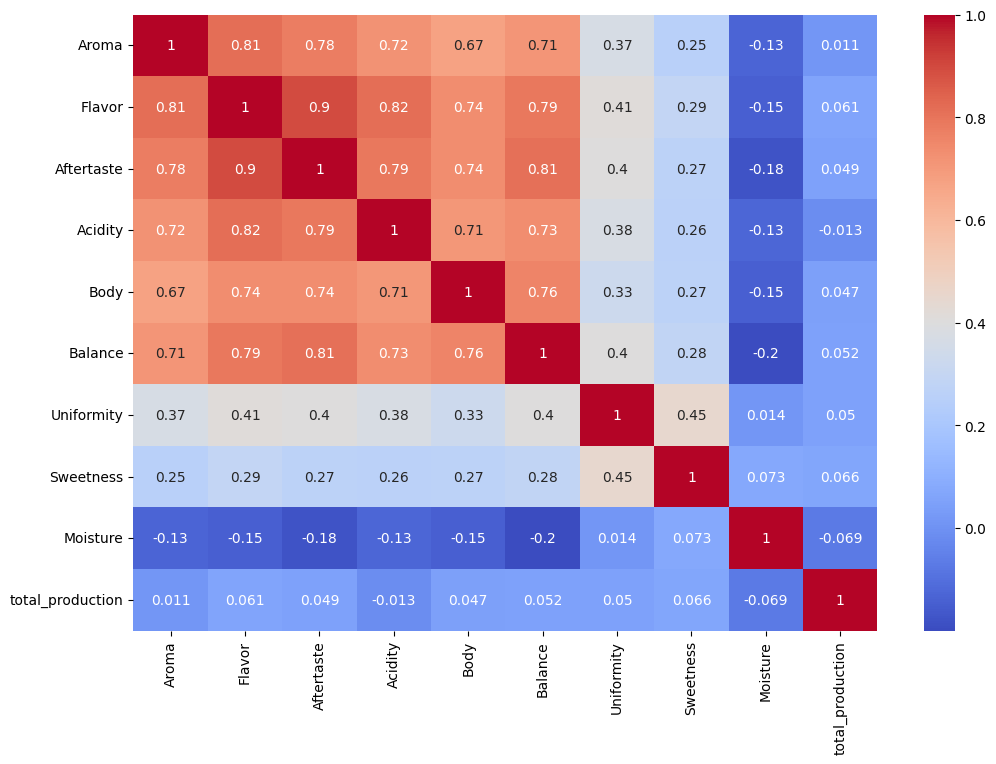

In [59]:
# Matriz de correlación
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar las columnas numéricas para la matriz de correlación
selected_columns = ['Aroma', 'Flavor', 'Aftertaste', 'Acidity', 'Body', 'Balance', 'Uniformity', 'Sweetness', 'Moisture', 'total_production']
colnumericas = coffee_data[selected_columns]

# Calcular la matriz de correlación
correlation_matrix = colnumericas.corr()

# Visualizar la matriz de correlación usando un mapa de calor
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()


**Fuerte Correlación entre Atributos de Calidad:**

Aroma, Flavor, Aftertaste, Acidity, Body, Balance: Estos atributos muestran una alta correlación entre sí, con valores superiores a 0.7 en la mayoría de los casos.
Esto sugiere que los cafés que tienden a puntuar bien en uno de estos atributos también tienden a puntuar bien en los otros.

Flavor y Aftertaste tienen una correlación particularmente alta (0.9), lo que indica que un buen sabor a menudo se asocia con un buen gusto.

**Uniformity y Sweetness:**

Uniformity y Sweetness tienen correlaciones más débiles con los otros atributos de calidad (en torno a 0.25-0.45), lo que podría sugerir que estos factores son algo más independientes o que no están tan fuertemente influenciados por los demás atributos.
Uniformity muestra cierta correlación con Balance (0.4), lo que podría indicar que una uniformidad alta contribuye a una experiencia de café más equilibrada.

**Moisture:**

Moisture (Humedad) muestra correlaciones negativas débiles con la mayoría de los atributos de calidad, lo que podría indicar que una mayor humedad en el café podría tener un efecto negativo leve sobre algunos atributos de calidad. Sin embargo, estas correlaciones son muy bajas y podrían no ser significativas en la práctica.

**Producción Total vs. Atributos de Calidad:**

Producción Total no muestra una fuerte correlación con ninguno de los atributos de calidad (todos los valores son cercanos a 0). Esto sugiere que la cantidad de café producido en un país no está directamente relacionada con la calidad del café en términos de los atributos analizados. En otras palabras, países que producen grandes cantidades de café no necesariamente producen café de mayor o menor calidad.

**⛳ 5. ¿Qué países tienen las calificaciones de calidad de café más altas y cómo se correlaciona esto con su producción total?**



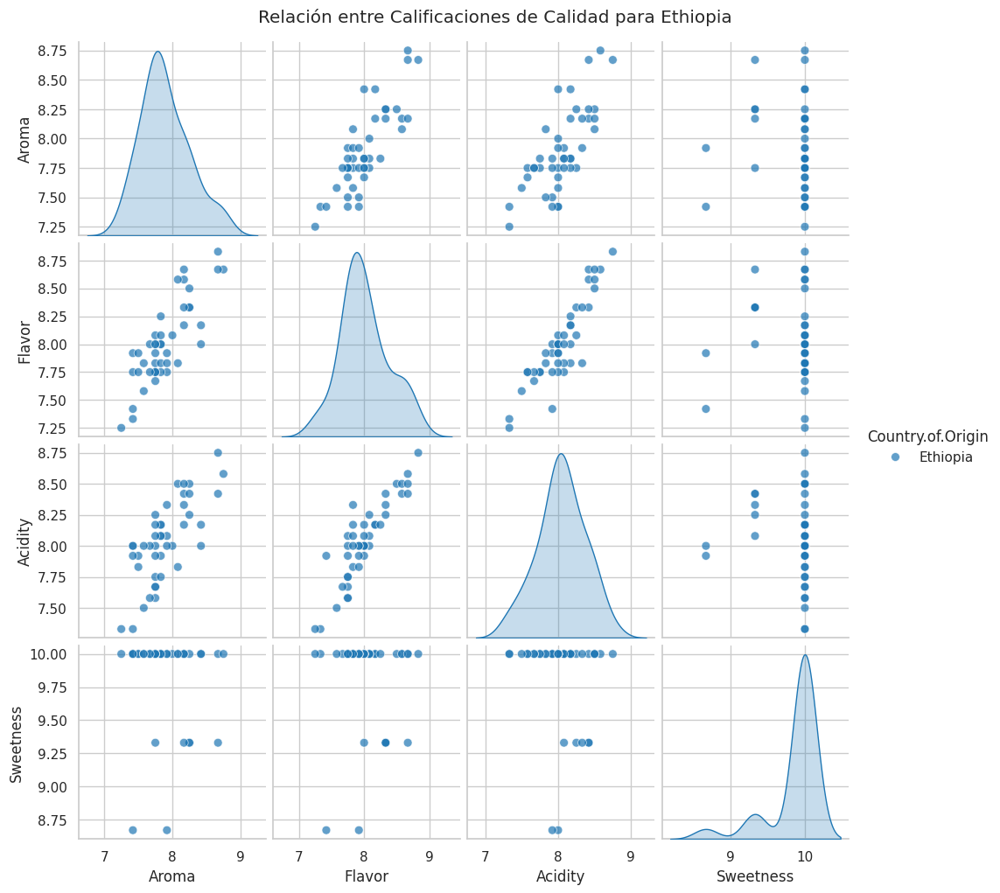

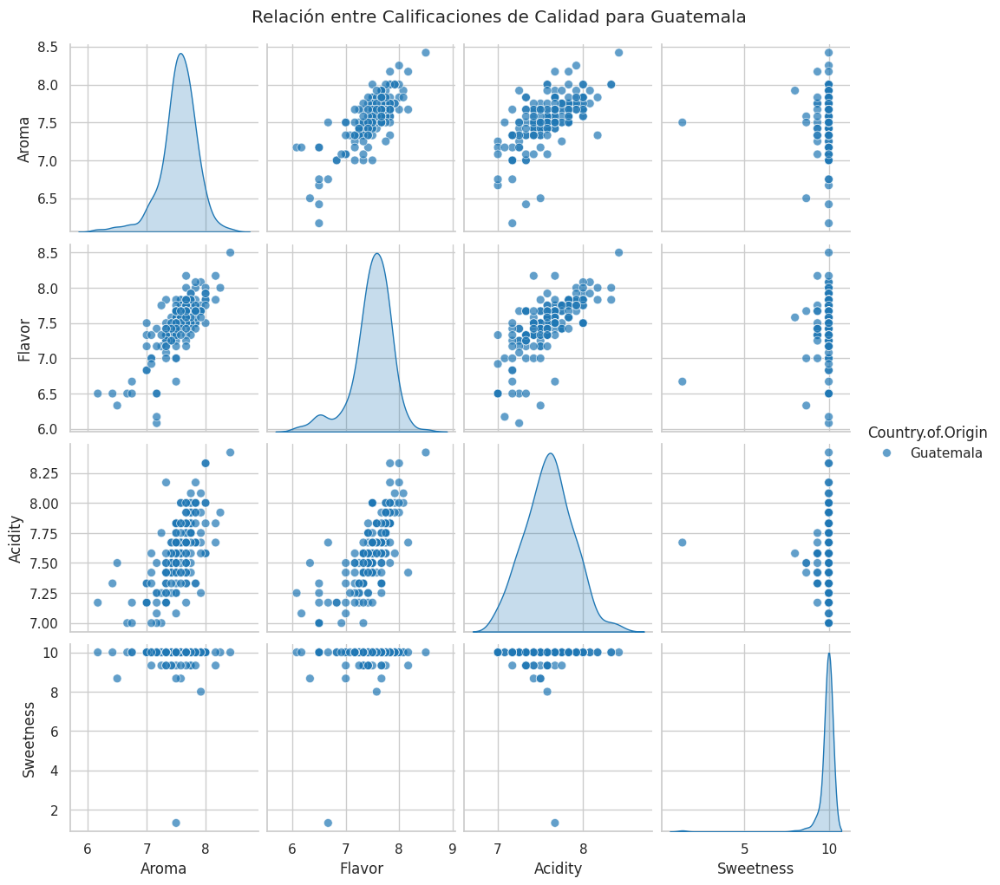

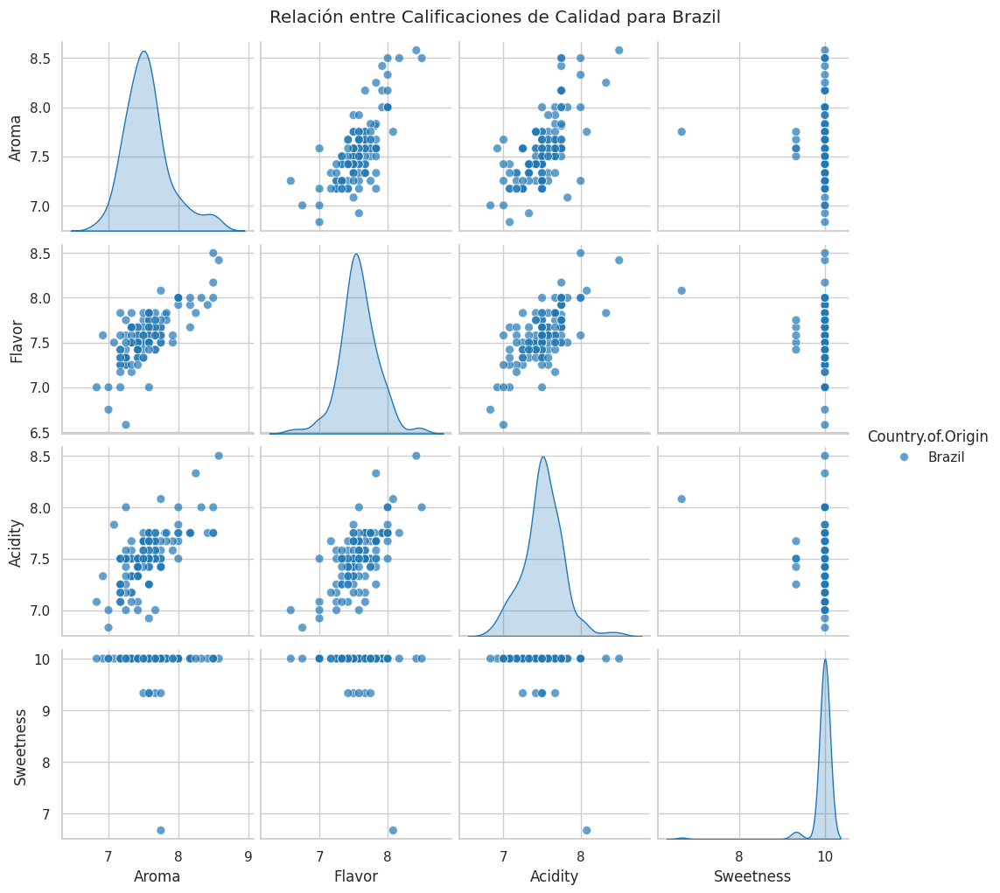

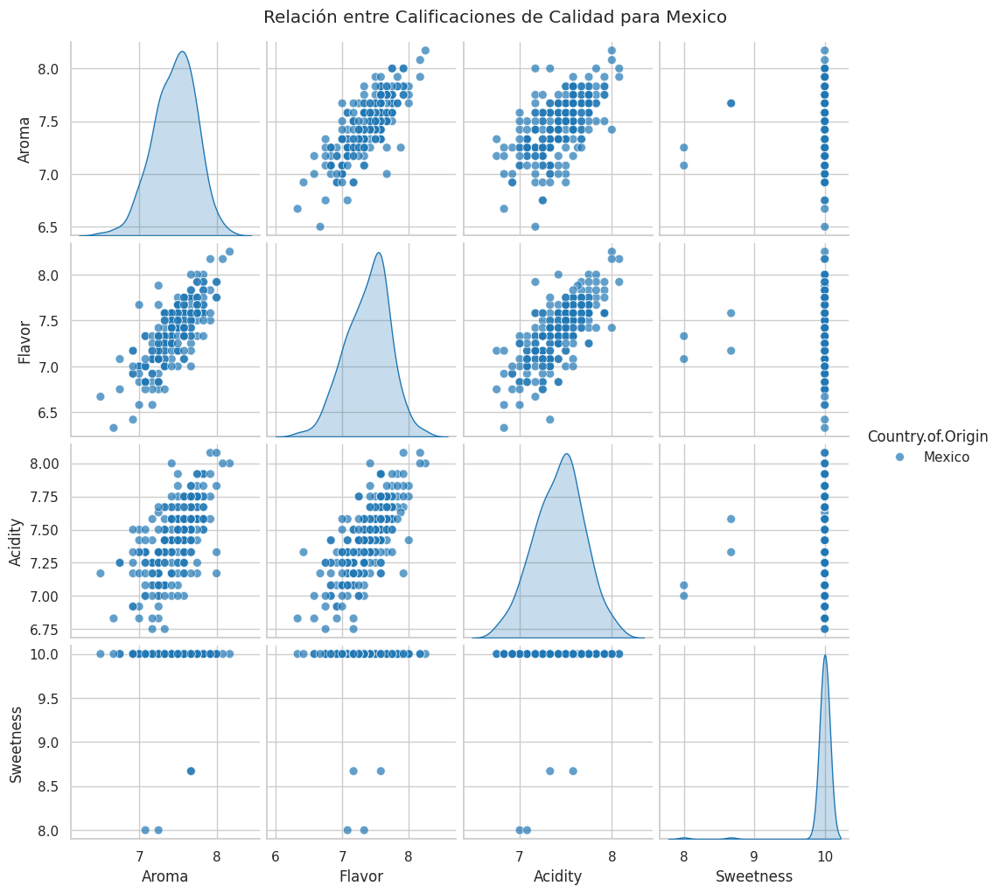

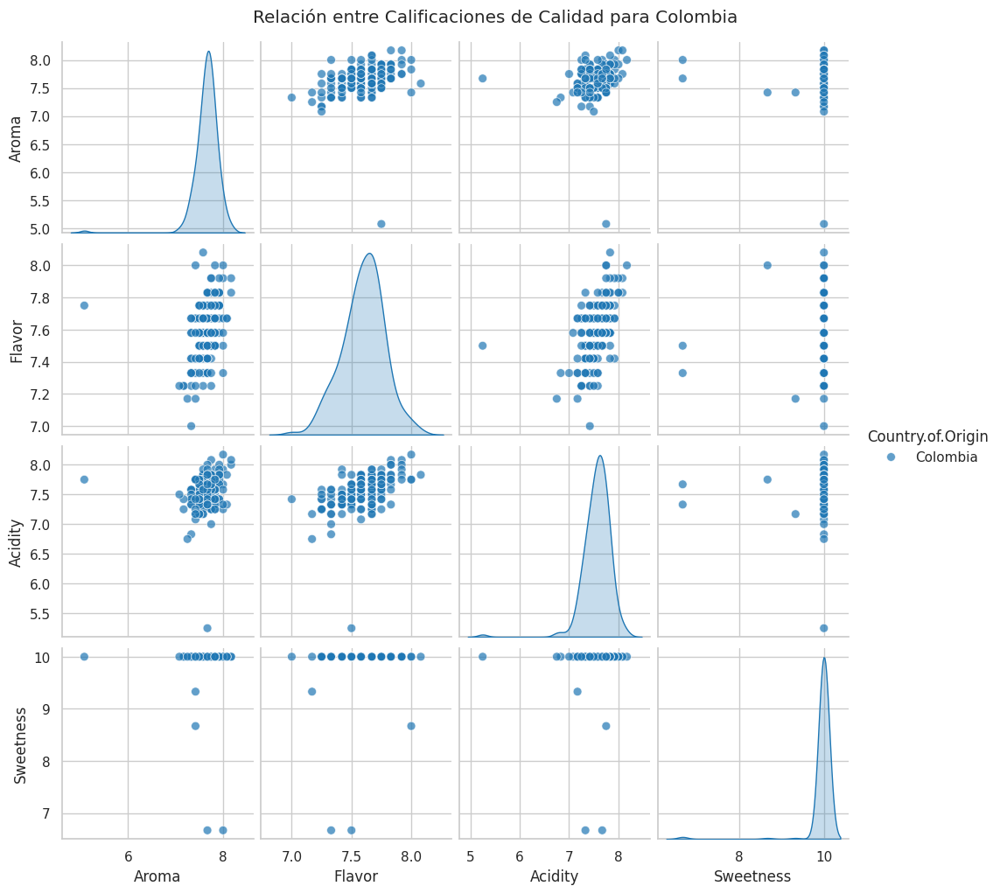

In [78]:
# Seleccionar las columnas relevantes para el análisis
selected_columns = ['Aroma', 'Flavor', 'Acidity', 'Sweetness','Country.of.Origin']

coffee_dataset_top_5 = coffee_dataset[coffee_dataset['Country.of.Origin'].isin(top_5_productores['Country.of.Origin'])]

# Crear un nuevo DataFrame con las columnas seleccionadas
coffee_selected = coffee_dataset_top_5[selected_columns]

for country in coffee_selected['Country.of.Origin'].unique():
    country_data = coffee_selected[coffee_selected['Country.of.Origin'] == country]
    sns.pairplot(country_data, hue='Country.of.Origin', diag_kind='kde', palette='tab20', plot_kws={'alpha':0.7, 's':50})
    plt.suptitle(f'Relación entre Calificaciones de Calidad para {country}', y=1.02)
    plt.show()

## Análisis del top 3 de paises productores

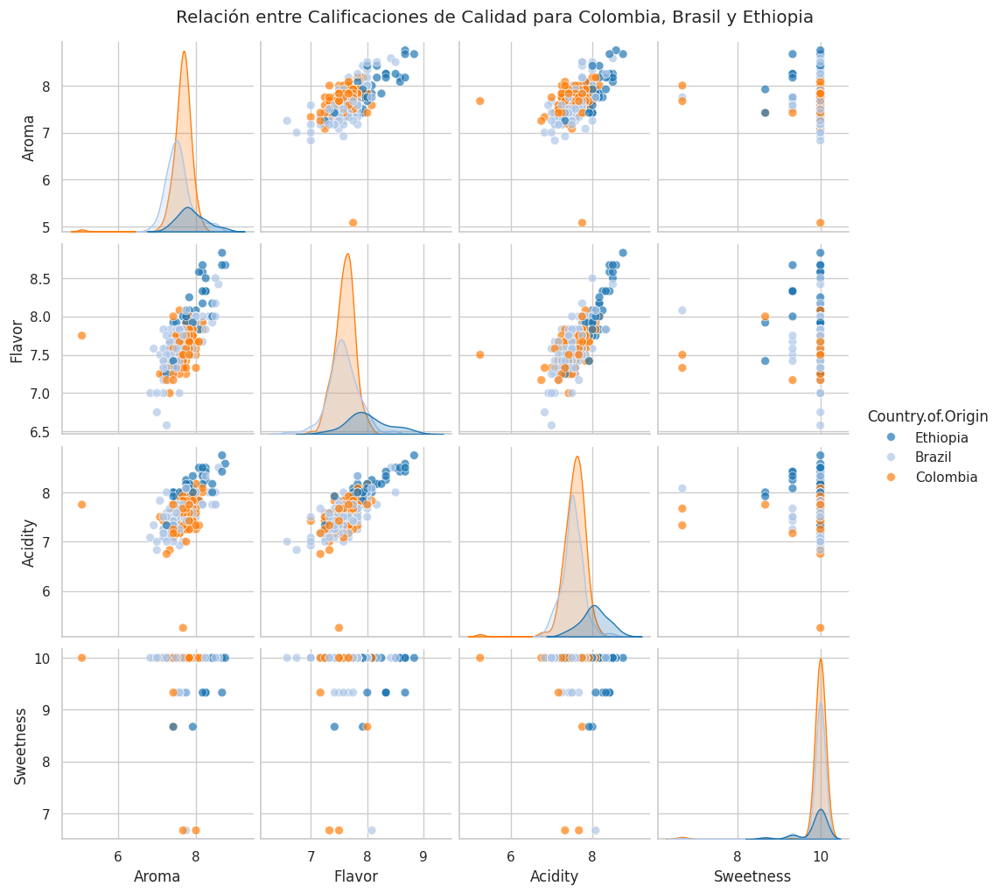

In [84]:
# Seleccionar las columnas relevantes para el análisis
selected_columns = ['Aroma', 'Flavor', 'Acidity', 'Sweetness', 'Country.of.Origin']

# Filtrar el dataset para los países de Colombia y Brasil
coffee_selected = coffee_dataset[coffee_dataset['Country.of.Origin'].isin(['Colombia', 'Brazil', 'Ethiopia'])][selected_columns]

# Crear un gráfico de dispersión múltiple (pairplot)
sns.pairplot(coffee_selected, hue='Country.of.Origin', diag_kind='kde', palette='tab20', plot_kws={'alpha':0.7, 's':50})
plt.suptitle('Relación entre Calificaciones de Calidad para Colombia, Brasil y Ethiopia', y=1.02)
plt.show()


In [77]:
coffee_data = pd.read_csv('coffee_dataset.csv')

top_10_productores = coffee_data.groupby('Country.of.Origin')['total_production'].sum().nlargest(10).reset_index()

# Filtrar el dataset para incluir solo los top 10 productores
coffee_data_top_10 = coffee_data[coffee_data['Country.of.Origin'].isin(top_10_productores['Country.of.Origin'])]

# Seleccionar columnas relacionadas con la calidad del café y la producción total
quality_columns = ['Aroma', 'Flavor', 'Aftertaste', 'Acidity', 'Body', 'Balance', 'Uniformity', 'Clean.Cup', 'Sweetness']
production_column = 'total_production'
country_column = 'Country.of.Origin'

# Filtrar las filas con datos completos en las columnas de calidad y producción
coffee_data_filtered = coffee_data_top_10.dropna(subset=quality_columns + [production_column, country_column])

# Calcular la calificación promedio de calidad del café por país
coffee_data_filtered['Quality_Score'] = coffee_data_filtered[quality_columns].mean(axis=1)

# Agrupar por país y calcular el promedio de la calidad y la producción total
country_quality_production = coffee_data_filtered.groupby(country_column).agg({
    'Quality_Score': 'mean',
    production_column: 'mean'
}).reset_index()

# Crear un scatter plot interactivo con plotly.express
fig = px.scatter(
    country_quality_production,
    x='total_production',
    y='Quality_Score',
    size='Quality_Score',
    color='Country.of.Origin',
    hover_name='Country.of.Origin',
    log_x=True,  # Usar escala logarítmica para la producción total
    title='Correlación entre la Calificación de Calidad del Café y la Producción Total por País',
    labels={
        'total_production': 'Producción Total de Café (en toneladas)',
        'Quality_Score': 'Calificación Promedio de Calidad del Café'
    }
)

fig.show()


## Conclusión #5

**Calidad vs. Producción:**

No parece haber una relación clara y directa entre la calificación promedio de calidad del café y la producción total. Países como Etiopía y Papúa Nueva Guinea tienen calificaciones de calidad relativamente altas pero producciones totales moderadas.

Por otro lado, países con altas producciones de café, como Brasil y Colombia, no tienen necesariamente las calificaciones más altas de calidad, aunque sus calificaciones aún son competitivas.

**Diversidad de calificaciones:**

Algunos países, como Costa Rica y Honduras, se encuentran en el rango medio tanto en calidad como en producción, lo que sugiere una consistencia en ambos aspectos.

Etiopía destaca con una alta calificación de calidad y una producción relativamente baja en comparación con otros grandes productores como Brasil.

**Implicaciones potenciales:**

Países con producciones menores pero con calificaciones altas podrían estar enfocándose en la producción de café de especialidad o de alta calidad, en lugar de la producción masiva.

Los países con grandes producciones pueden estar priorizando la cantidad sobre la calidad, aunque algunos, como Brasil y Colombia, logran mantener una calificación decente de calidad mientras producen en grandes volúmenes.